In [4]:
# 1. Install dependencies 
# pip install torch torchvision opencv-python numpy matplotlib

In [8]:
# 2. Load a pre-trained model, here we are using YOLO v5 

import torch
yolo = torch.hub.load('ultralytics/yolov5', 'yolov5s', pretrained=True) 
yolo

Using cache found in C:\Users\GANESH REDDY/.cache\torch\hub\ultralytics_yolov5_master
YOLOv5  2025-2-6 Python-3.12.2 torch-2.6.0+cpu CPU

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


AutoShape(
  (model): DetectMultiBackend(
    (model): DetectionModel(
      (model): Sequential(
        (0): Conv(
          (conv): Conv2d(3, 32, kernel_size=(6, 6), stride=(2, 2), padding=(2, 2))
          (act): SiLU(inplace=True)
        )
        (1): Conv(
          (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (act): SiLU(inplace=True)
        )
        (2): C3(
          (cv1): Conv(
            (conv): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1))
            (act): SiLU(inplace=True)
          )
          (cv2): Conv(
            (conv): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1))
            (act): SiLU(inplace=True)
          )
          (cv3): Conv(
            (conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1))
            (act): SiLU(inplace=True)
          )
          (m): Sequential(
            (0): Bottleneck(
              (cv1): Conv(
                (conv): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1))
  

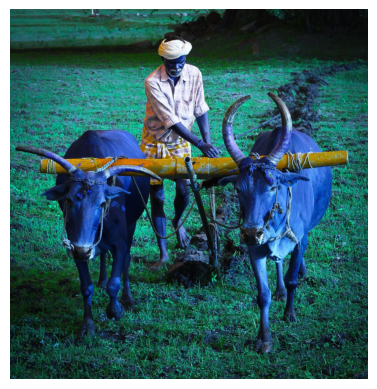

In [17]:
# 3. Load an image for detection 

import cv2 
import matplotlib.pyplot as plt 
%matplotlib inline

img = cv2.imread('farmer.jpg') # reads image in BGR formats 

plt.imshow(img)
plt.axis('off') 
plt.show()

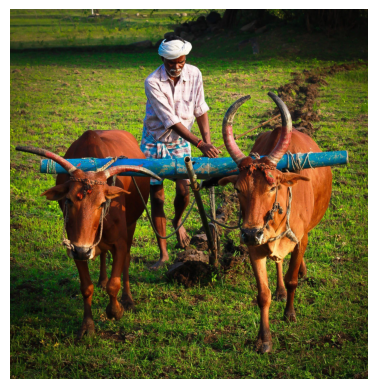

In [18]:
# for feeding image to our YOLO, it should be in RGB 
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) 
plt.imshow(img)  # real image
plt.axis('off') 
plt.show()

In [21]:
# 4. Perform object detection 
res = yolo('farmer.jpg') 
res

C:\Users\GANESH REDDY/.cache\torch\hub\ultralytics_yolov5_master\models\common.py:894: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


YOLOv5 <class 'models.common.Detections'> instance
image 1/1: 2000x1936 1 person, 2 cows
Speed: 91.0ms pre-process, 202.0ms inference, 1.0ms NMS per image at shape (1, 3, 640, 640)

image 1/1: 2000x1936 1 person, 2 cows 
Model is working fine from above line

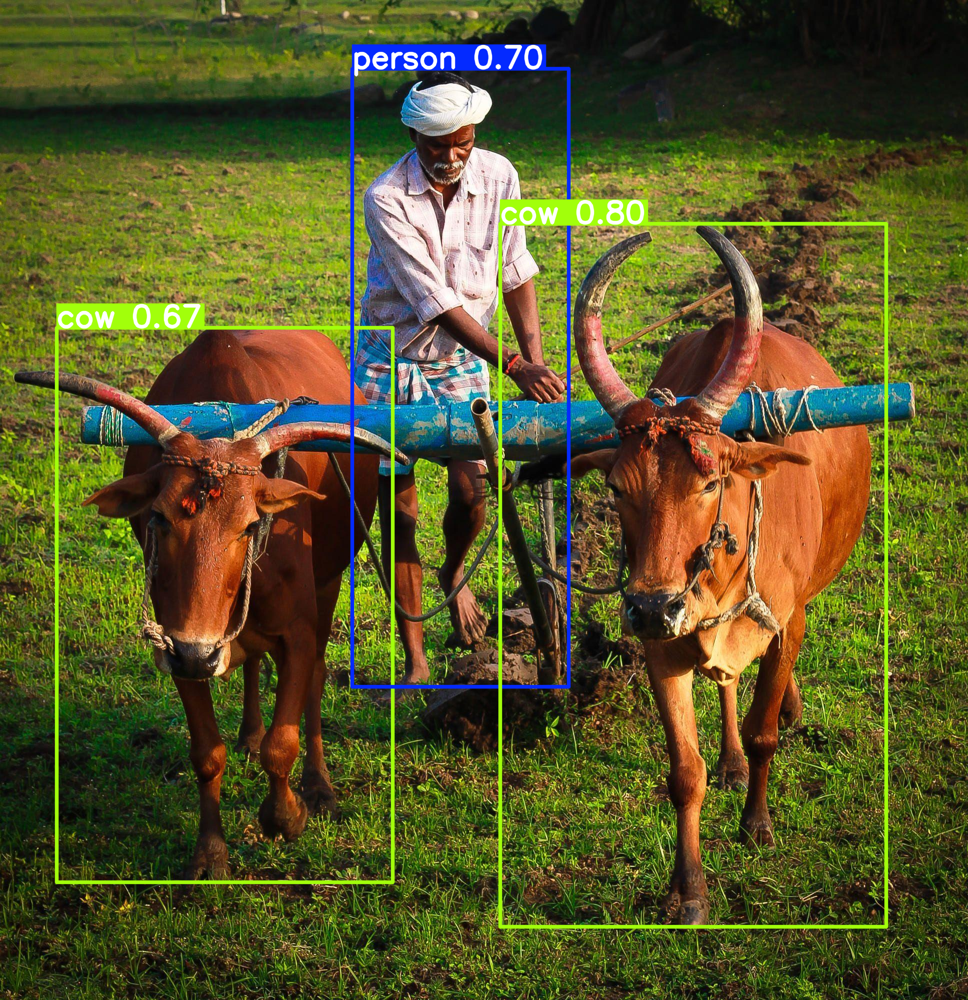

In [25]:
# 5. Display the detected objects 
res.show()

In [27]:
res.render()

[array([[[73, 84, 24],
         [75, 87, 25],
         [81, 91, 30],
         ...,
         [38, 33, 14],
         [29, 26,  9],
         [24, 23,  5]],
 
        [[80, 91, 31],
         [81, 93, 31],
         [84, 94, 31],
         ...,
         [35, 29, 13],
         [27, 24,  7],
         [22, 21,  3]],
 
        [[85, 97, 35],
         [85, 97, 33],
         [85, 96, 30],
         ...,
         [30, 27, 12],
         [23, 21,  6],
         [17, 18,  2]],
 
        ...,
 
        [[33, 46,  2],
         [37, 50,  6],
         [35, 50,  7],
         ...,
         [57, 75, 37],
         [55, 78, 24],
         [34, 58,  0]],
 
        [[32, 53,  0],
         [43, 64,  7],
         [46, 66, 13],
         ...,
         [44, 61, 27],
         [32, 52,  3],
         [34, 55,  0]],
 
        [[53, 78, 13],
         [65, 89, 27],
         [64, 88, 28],
         ...,
         [33, 50, 18],
         [18, 37,  0],
         [39, 59,  6]]], dtype=uint8)]

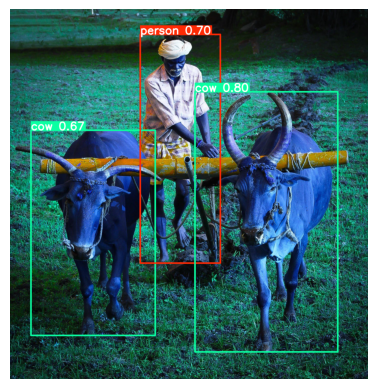

In [37]:
import numpy as np 
from PIL import Image 

img_array = np.squeeze(res.render()) # for the above 3D convert into 2D using squeeze() reduces 1D each time
img_array = cv2.cvtColor(img_array, cv2.COLOR_RGB2BGR) # openCV accepts only BGR format

plt.imshow(img_array)
plt.axis('off')
plt.show()

In [38]:
# 6. Extract bouding box details for further process 

df = res.pandas().xyxy[0] 
df

,xmin,ymin,xmax,ymax,confidence,class,name
0,1000.556946,447.272064,1772.614868,1853.780762,0.796702,19,cow
1,704.866638,137.765549,1137.071167,1373.974121,0.698405,0,person
2,113.897064,655.913208,785.085083,1764.602295,0.666397,19,cow


In [41]:
# 7. Process and save img 
res.save('farmer_detected.jpg') 
'saved'

Saved 1 image to runs\detect\exp


'saved'